In [75]:
import numpy as np
import librosa
import os
import pyedflib
import json
import sklearn
import matplotlib.pyplot as plt
import mne
import pywt
from pathlib import Path

In [122]:
files = []
files.append("data/eeg-13-03-24_12-14.edf")
files.append("data/eeg-06-05-24_13-07.edf")
files.append("data/eeg-21-03-24_13-50.edf")

iir_params = {'order':4, 'ftype':"butter"}
data = []
marks = []
loaded_data = []
for n in range(3):
    event_names = []
    loaded_data.append(mne.io.read_raw_edf(files[n]))
    loaded_data[n].load_data()
    loaded_data[n].set_montage('standard_1020')

    loaded_data[n].filter(2.,60., method='iir', iir_params=iir_params)
    
    events = mne.events_from_annotations(loaded_data[n])
    arr_events = events[0]
    print(events)
    dict = events[1]
    if "wrong answer" in dict:
        event_names.append(dict["wrong answer"])
    if "right answer" in dict:
        event_names.append(dict["right answer"])
    for i in range(8):
        if arr_events[i,2] in event_names:
            if (arr_events[i,0] == arr_events[i+1,0]):
                break
        if arr_events[i,2] == event_names[1]:
            marks.append(1)
        if arr_events[i,2] == event_names[0]:
            marks.append(0)
    for i in range(8):
        if arr_events[i,2] in event_names:
            data.append(loaded_data[n].copy().crop(arr_events[i,0]/125-3,arr_events[i,0]/125+5))

print(data)
print(marks)

Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\eeg-13-03-24_12-14.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 292874  =      0.000 ...  2342.992 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 60 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 2.00, 60.00 Hz: -6.02, -6.02 dB

Used Annotations descriptions: ['end task', 'right answer', 'start task', 'wrong answer']
(array([[     1,      0,      3],
       [ 77860,      0,      2],
       [ 78184,      0,      1],
       [ 78184,      0,      3],
       [114049,      0,      2],
       [114370,      0,      1],
       [114376,      0,      3],
       [159373,      0,      4],
       [161062,      0,      1],
       [161062,      0,      3],
  

1
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


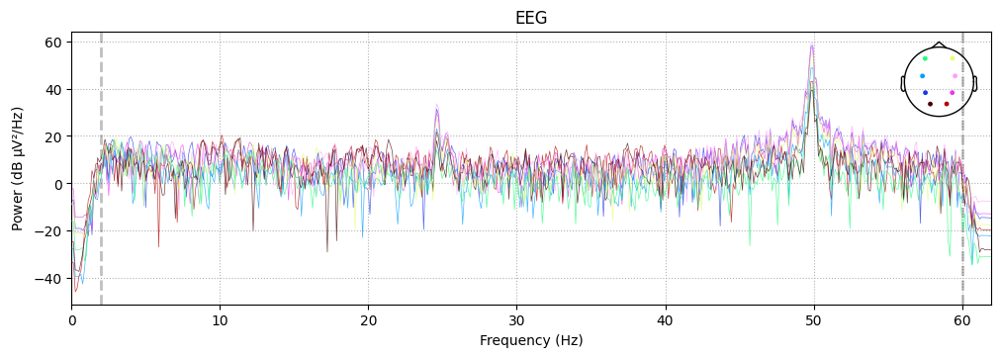

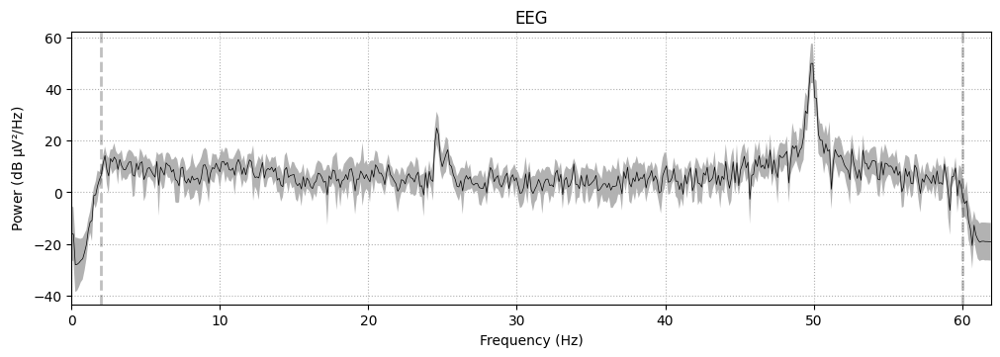

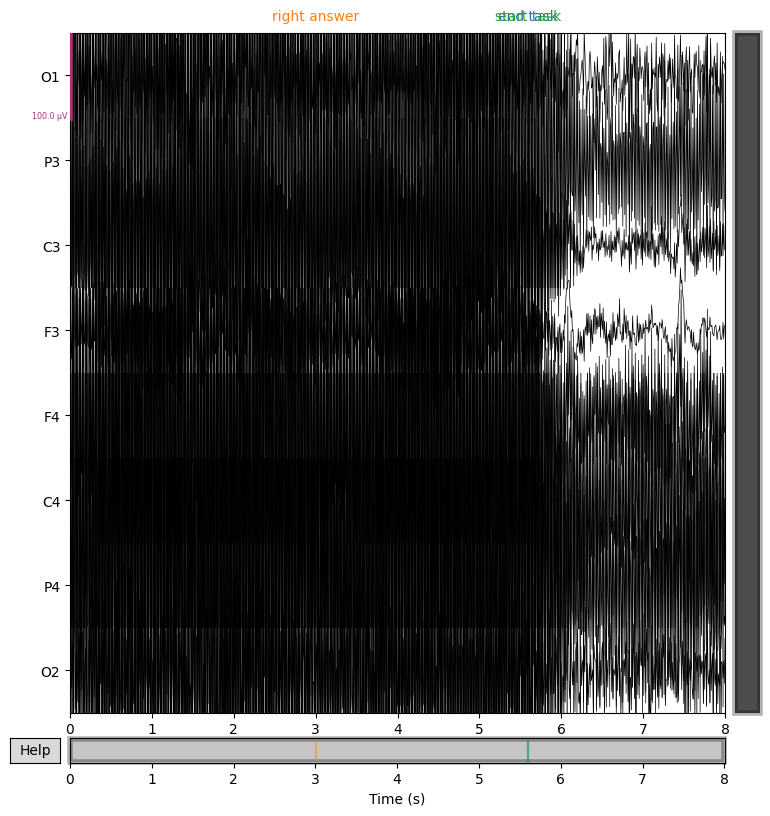

1
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


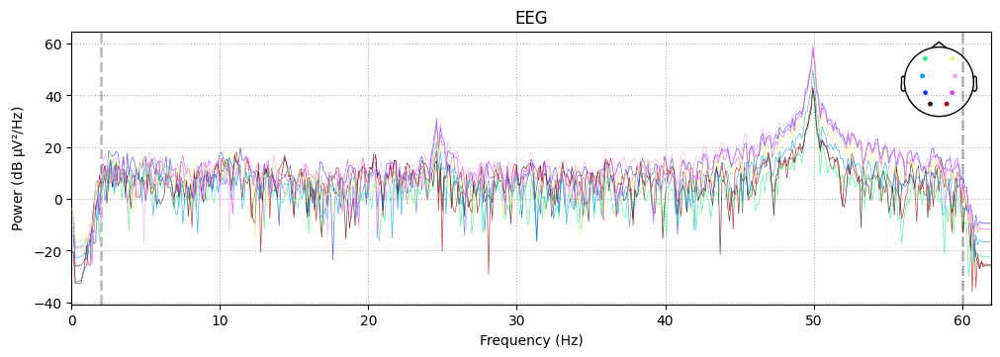

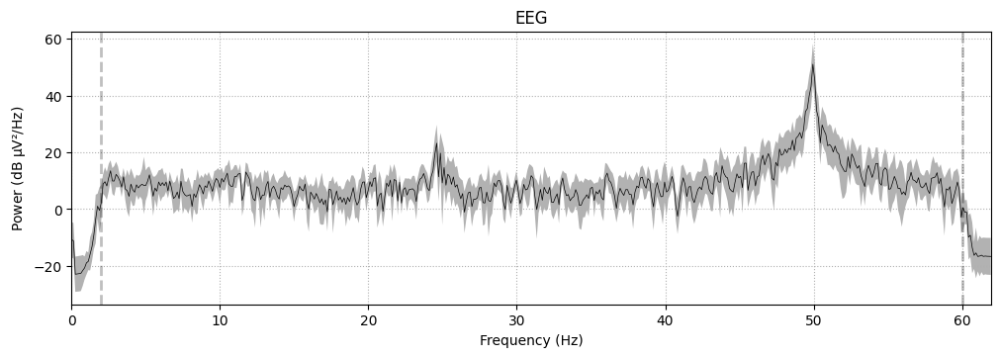

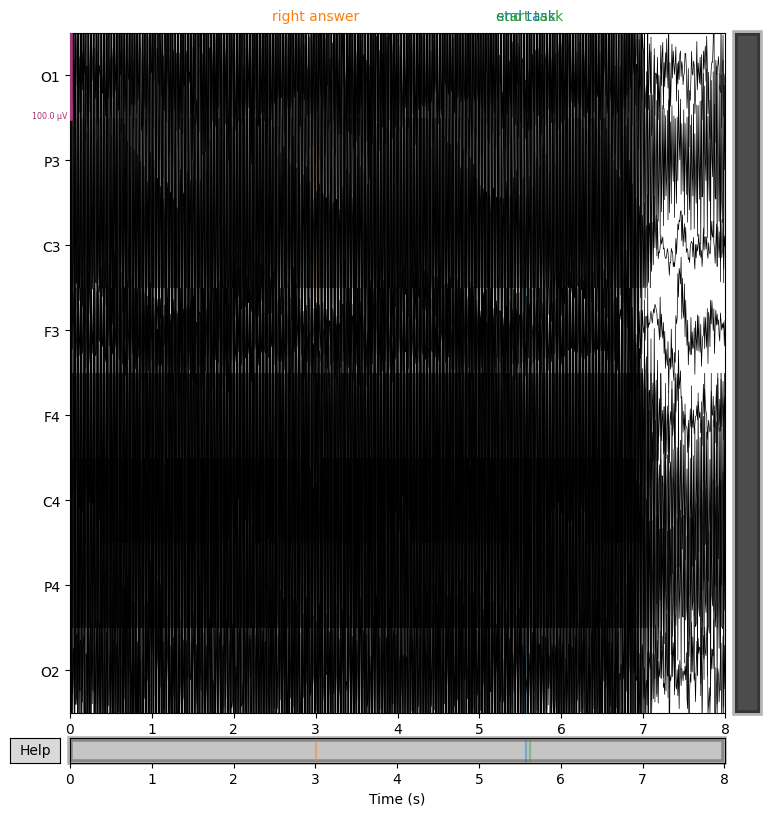

0
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


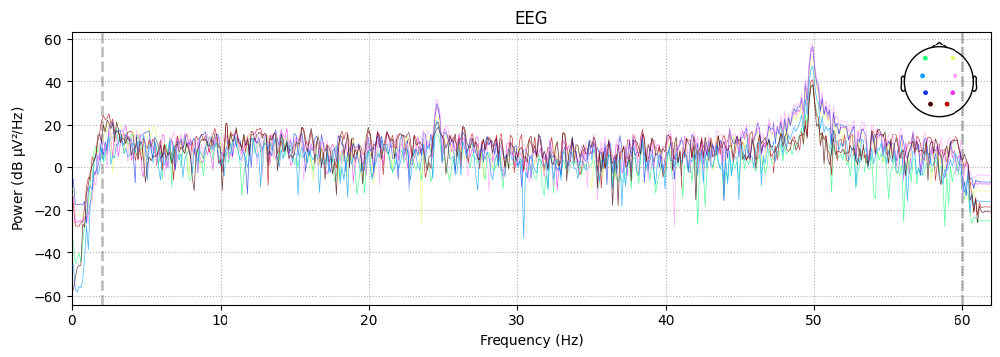

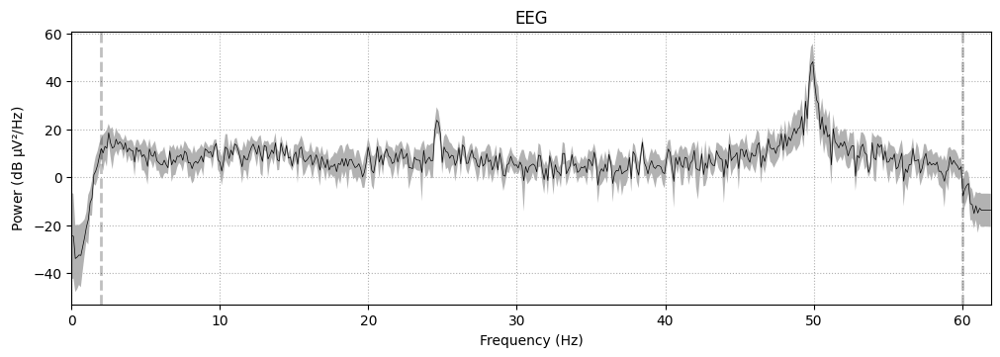

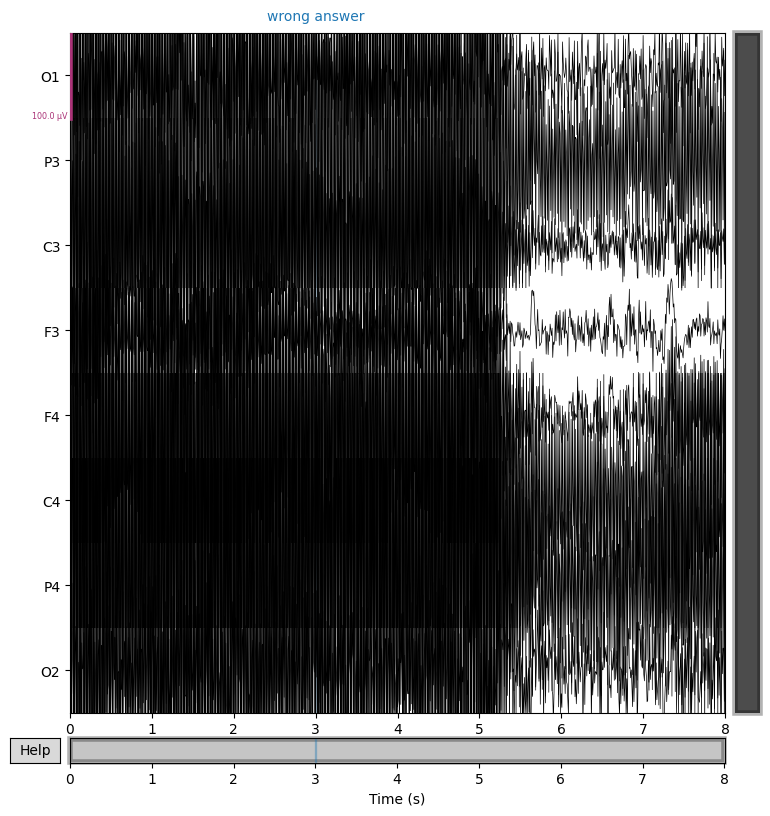

0
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


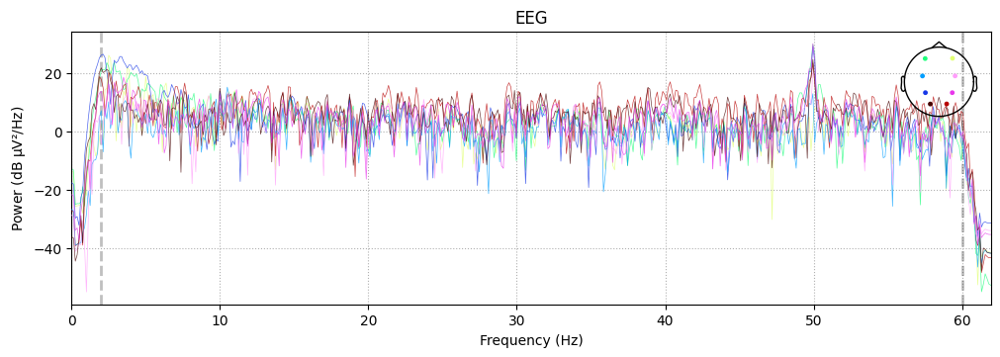

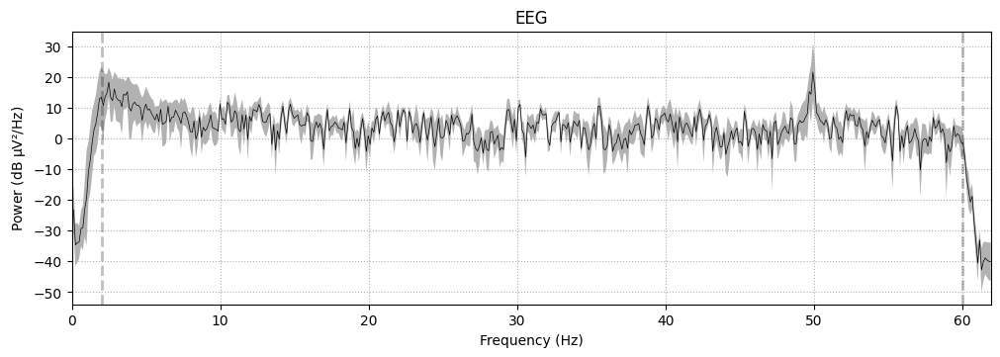

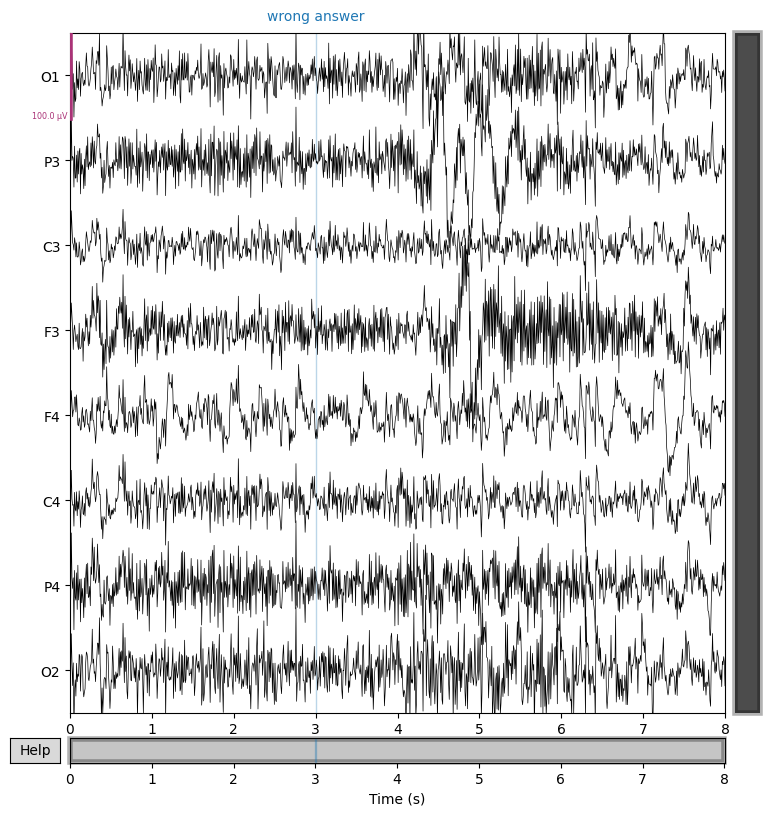

0
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


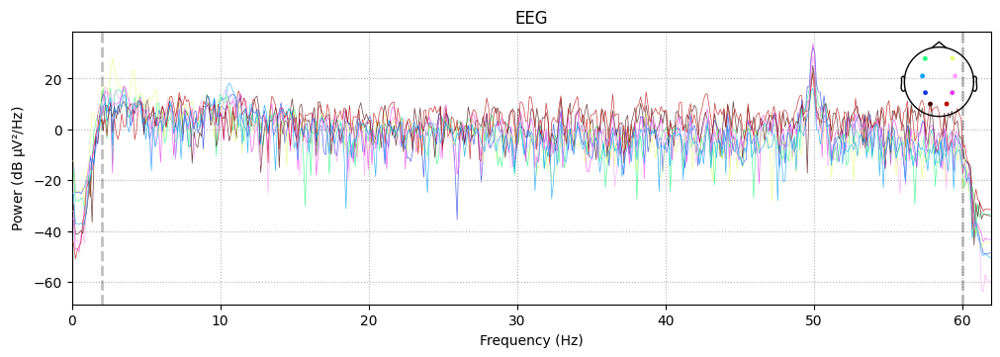

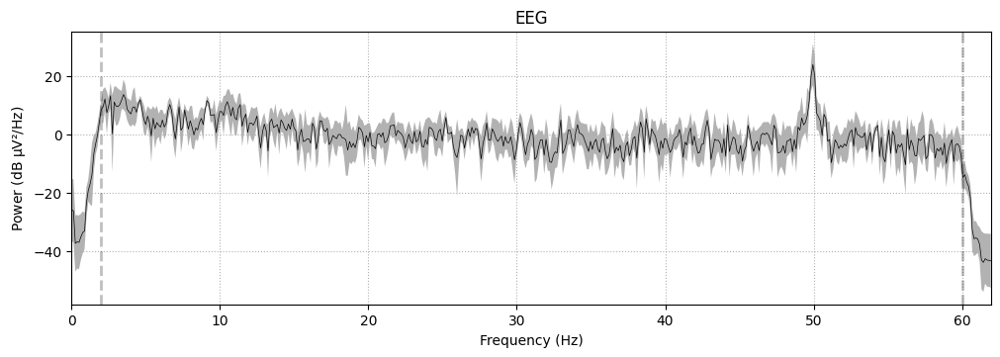

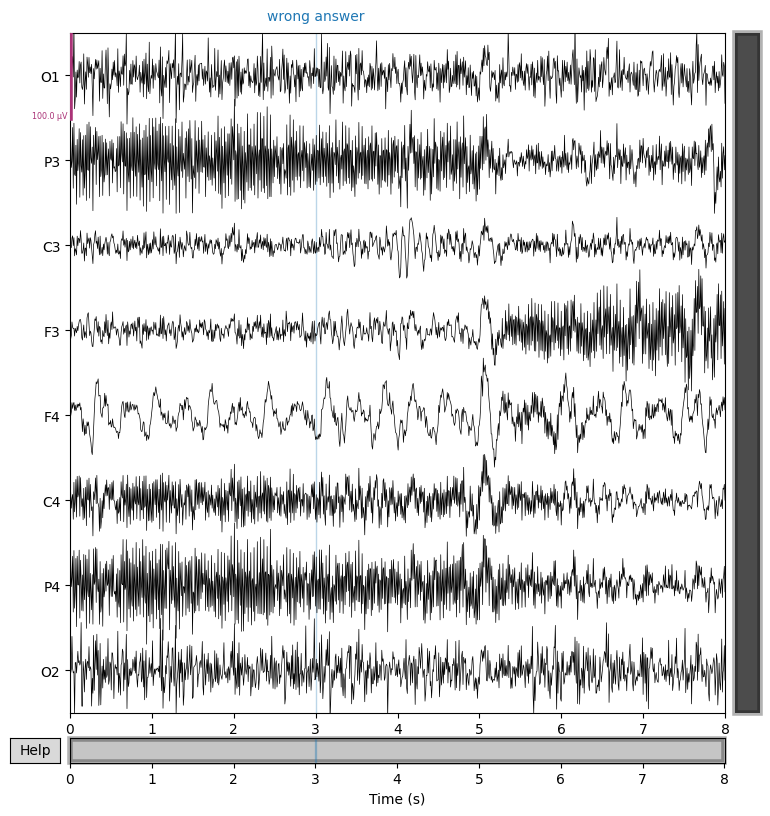

1
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


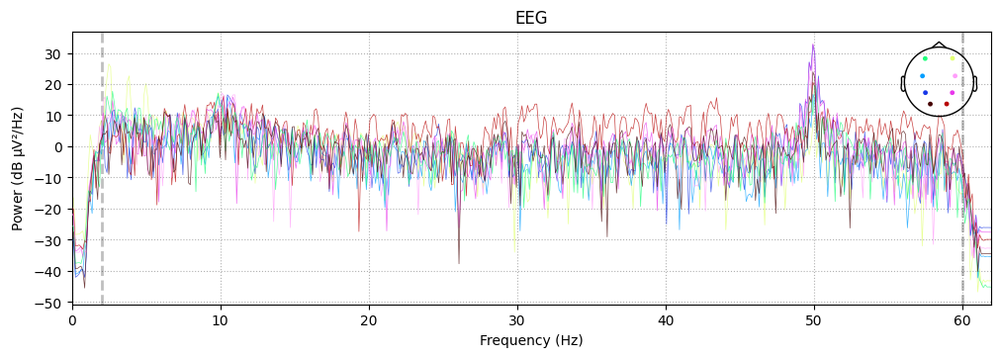

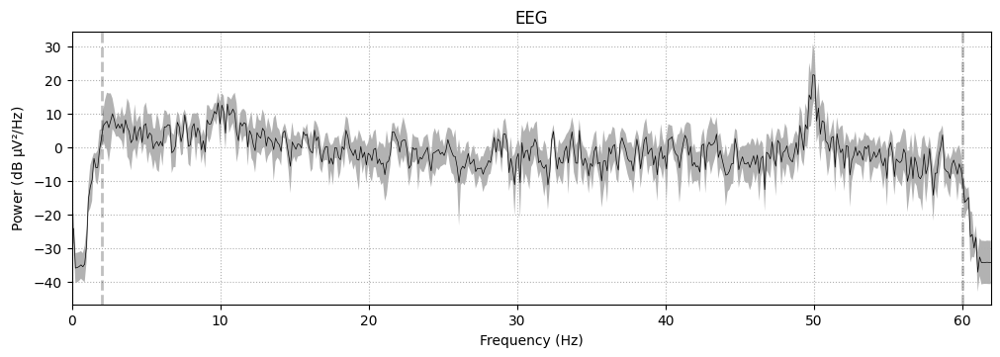

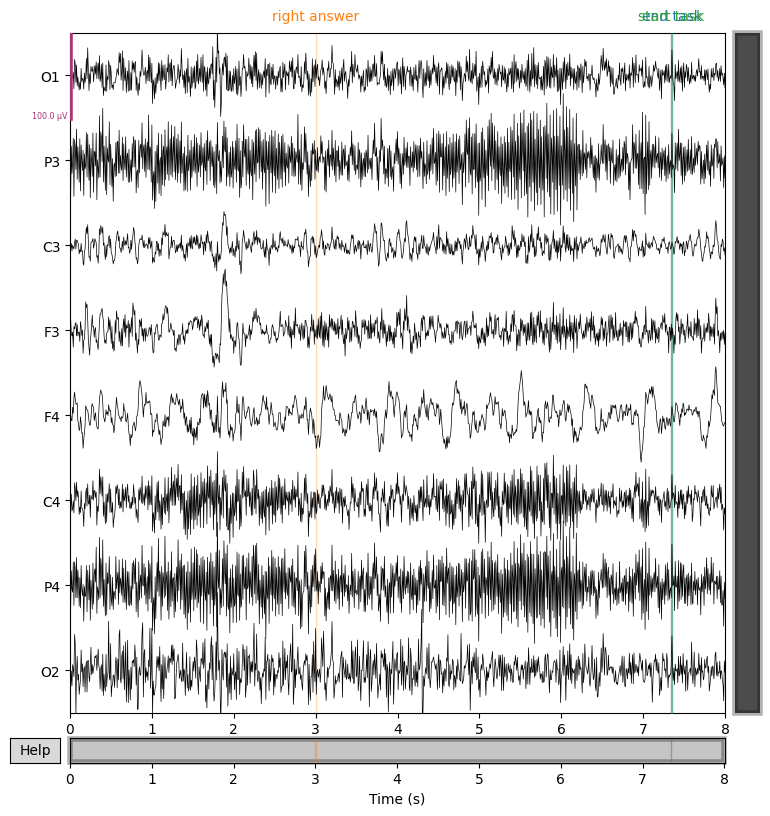

0
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


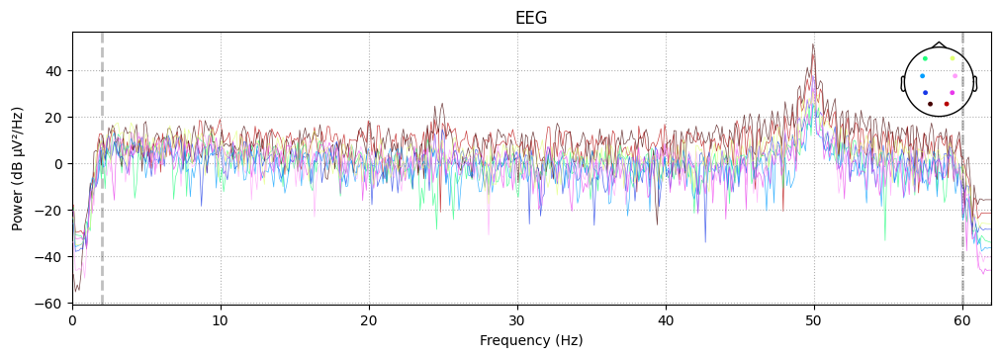

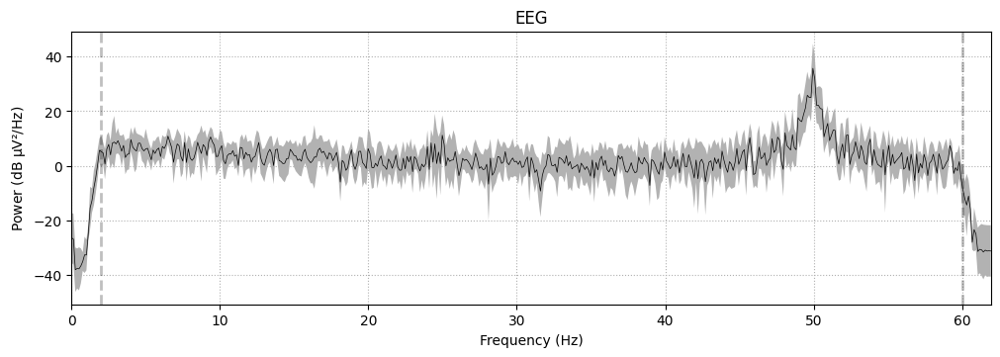

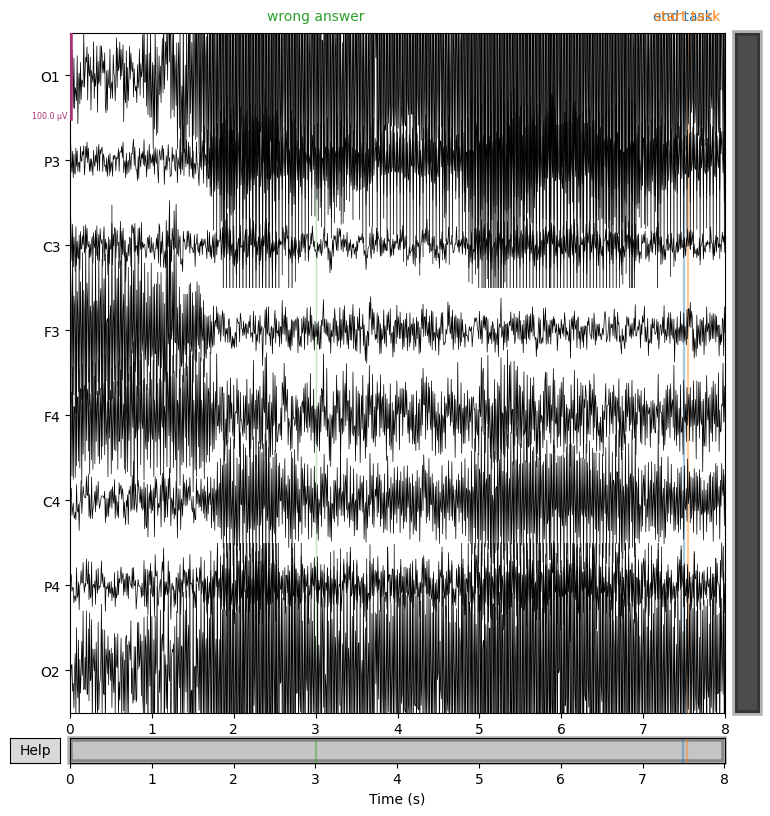

1
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


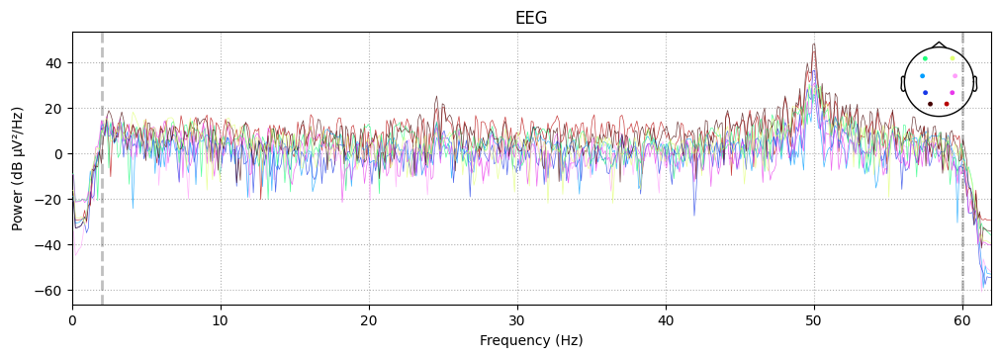

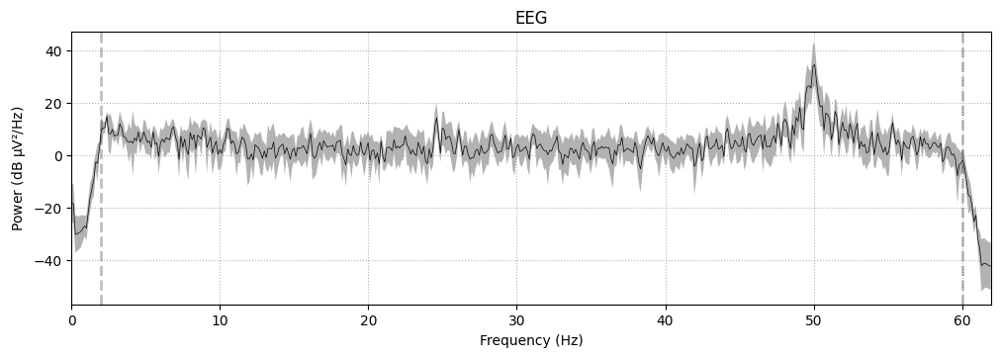

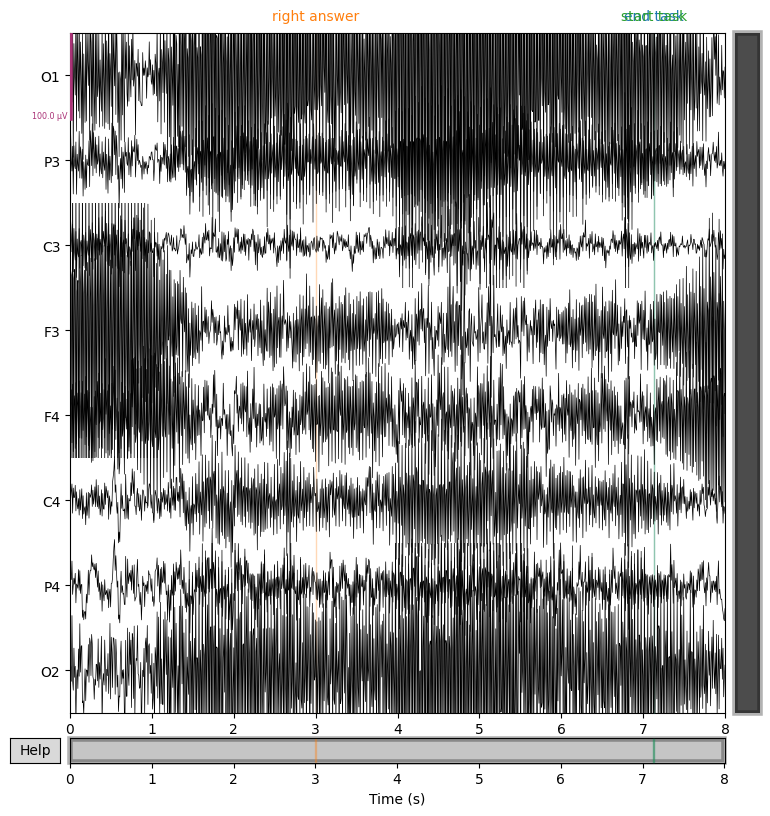

1
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).
Effective window size : 8.008 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


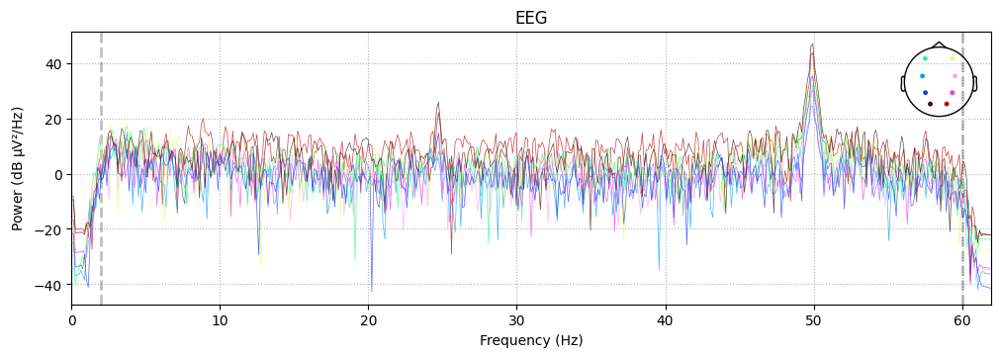

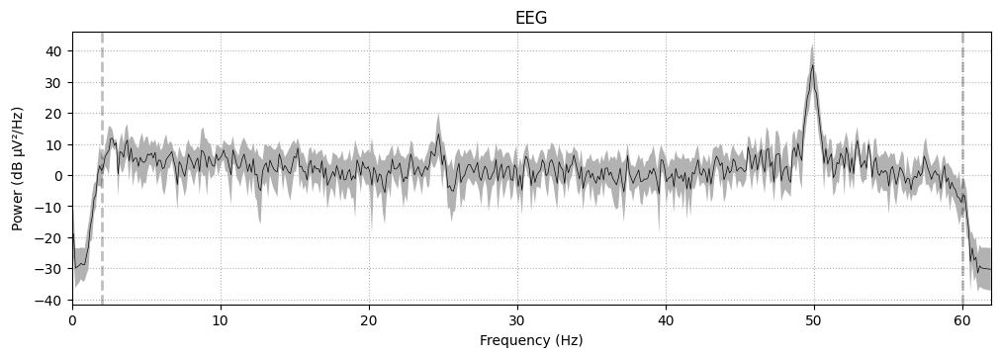

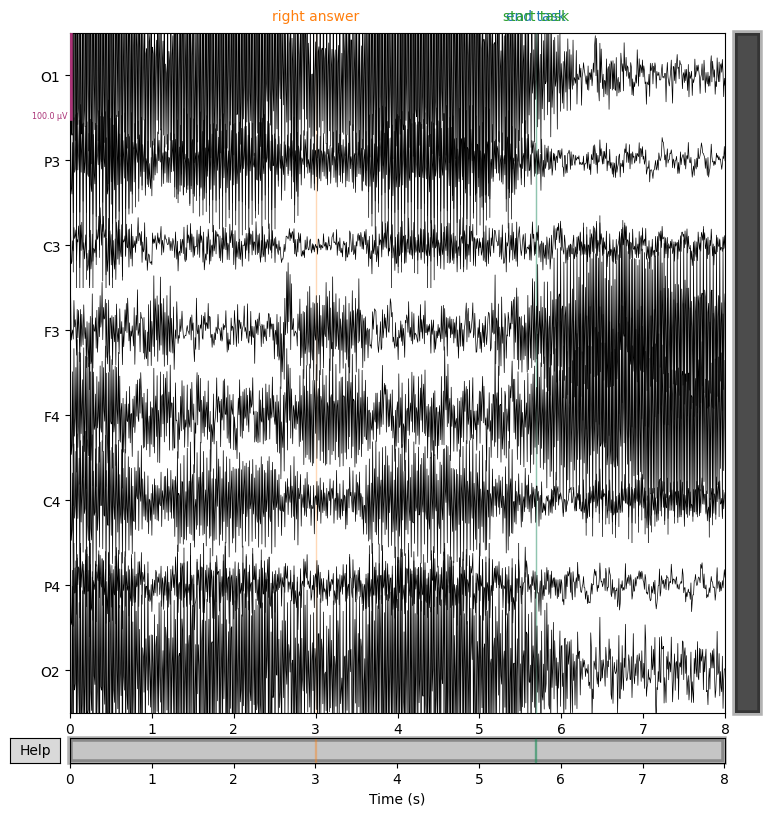

In [123]:
for j in range(9):
    print(marks[j])
    data[j].copy().compute_psd(fmax=62).plot(picks="data", exclude="bads", amplitude=False)
    data[j].copy().compute_psd(fmax=62).plot(picks="data", exclude="bads", amplitude=False, average=True)
    data[j].plot(scalings=50e-6)

[ 2.          2.58585859  3.17171717  3.75757576  4.34343434  4.92929293
  5.51515152  6.1010101   6.68686869  7.27272727  7.85858586  8.44444444
  9.03030303  9.61616162 10.2020202  10.78787879 11.37373737 11.95959596
 12.54545455 13.13131313 13.71717172 14.3030303  14.88888889 15.47474747
 16.06060606 16.64646465 17.23232323 17.81818182 18.4040404  18.98989899
 19.57575758 20.16161616 20.74747475 21.33333333 21.91919192 22.50505051
 23.09090909 23.67676768 24.26262626 24.84848485 25.43434343 26.02020202
 26.60606061 27.19191919 27.77777778 28.36363636 28.94949495 29.53535354
 30.12121212 30.70707071 31.29292929 31.87878788 32.46464646 33.05050505
 33.63636364 34.22222222 34.80808081 35.39393939 35.97979798 36.56565657
 37.15151515 37.73737374 38.32323232 38.90909091 39.49494949 40.08080808
 40.66666667 41.25252525 41.83838384 42.42424242 43.01010101 43.5959596
 44.18181818 44.76767677 45.35353535 45.93939394 46.52525253 47.11111111
 47.6969697  48.28282828 48.86868687 49.45454545 50.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Applying baseline correction (mode: logratio)


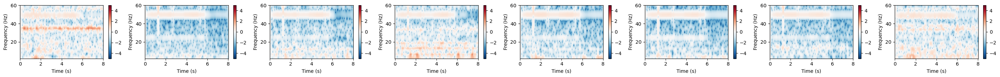

<RawEDF | eeg-13-03-24_12-14.edf, 8 x 1001 (8.0 s), ~81 kB, data loaded>
(1, 8, 376)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Applying baseline correction (mode: logratio)


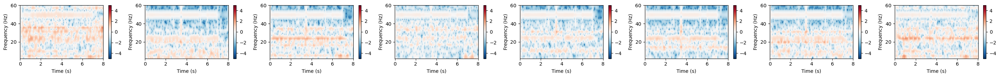

<RawEDF | eeg-13-03-24_12-14.edf, 8 x 1001 (8.0 s), ~81 kB, data loaded>
(1, 8, 376)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Applying baseline correction (mode: logratio)


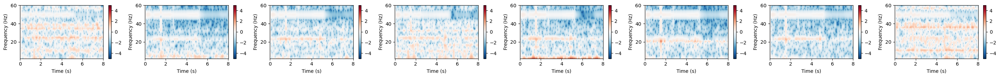

<RawEDF | eeg-06-05-24_13-07.edf, 8 x 1001 (8.0 s), ~81 kB, data loaded>
(1, 8, 376)
Applying baseline correction (mode: logratio)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


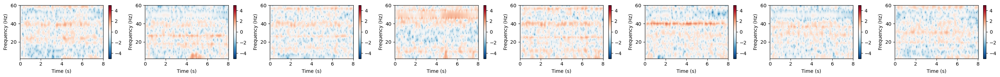

<RawEDF | eeg-06-05-24_13-07.edf, 8 x 1001 (8.0 s), ~81 kB, data loaded>
(1, 8, 376)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Applying baseline correction (mode: logratio)


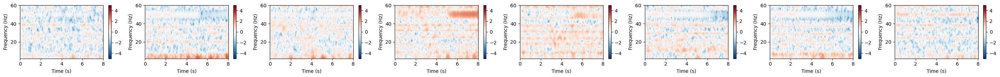

<RawEDF | eeg-06-05-24_13-07.edf, 8 x 1001 (8.0 s), ~81 kB, data loaded>
(1, 8, 376)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Applying baseline correction (mode: logratio)


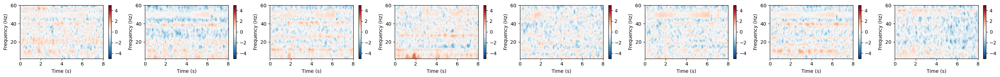

<RawEDF | eeg-21-03-24_13-50.edf, 8 x 1001 (8.0 s), ~81 kB, data loaded>
(1, 8, 376)
Applying baseline correction (mode: logratio)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


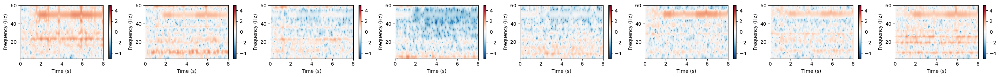

<RawEDF | eeg-21-03-24_13-50.edf, 8 x 1001 (8.0 s), ~81 kB, data loaded>
(1, 8, 376)
Applying baseline correction (mode: logratio)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


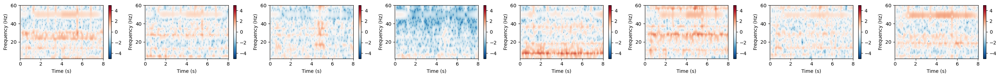

<RawEDF | eeg-21-03-24_13-50.edf, 8 x 1001 (8.0 s), ~81 kB, data loaded>
(1, 8, 376)
Applying baseline correction (mode: logratio)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


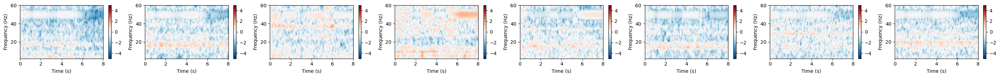

In [125]:
#freqs = np.logspace(np.log10(2), np.log10(55), 100)
freqs = np.linspace(2, 50, 100)
print(freqs)
print(data[0].get_data().shape)
n_cyc = freqs /2
#n_cyc = 6
print(n_cyc)
for j in range(9):
    print(data[j])
    #dt = data[j].get_data()
    #dt = dt.reshape((1, dt.shape[0], dt.shape[1]))
    print(dt.shape)
    #power = mne.time_frequency.tfr_array_morlet(dt, 125, freqs, n_cyc, use_fft=True, output='power')
    power = data[j].compute_tfr(method='morlet', freqs=freqs, n_cycles=n_cyc)
    av = power
    fig, axarr = plt.subplots(1, 8, figsize=(36,2))
    
    #power.plot(picks='data', axes=axarr, baseline=(0, 0.1), mode='logratio')
    power.plot(picks='data', axes=axarr, baseline=(0, 0.1), mode='logratio', vlim=(-5,5))

0
1
Effective window size : 8.008 (s)


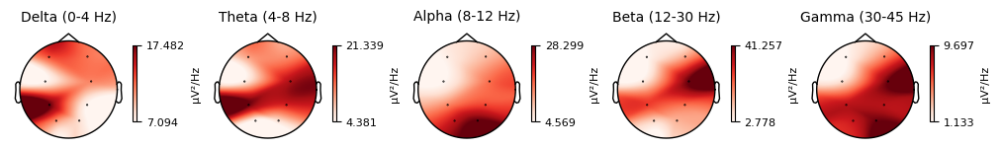

1
1
Effective window size : 8.008 (s)


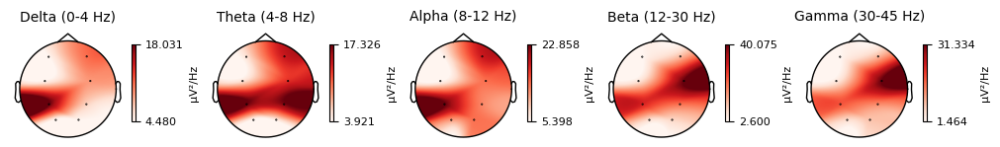

2
0
Effective window size : 8.008 (s)


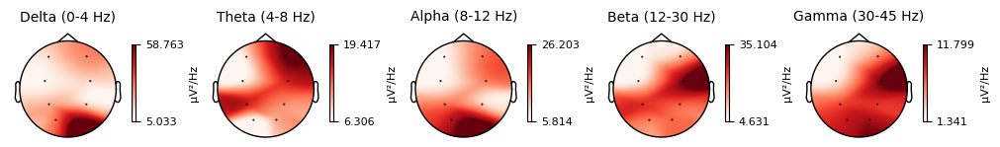

3
0
Effective window size : 8.008 (s)


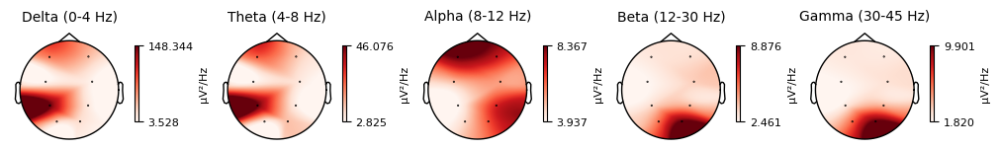

4
0
Effective window size : 8.008 (s)


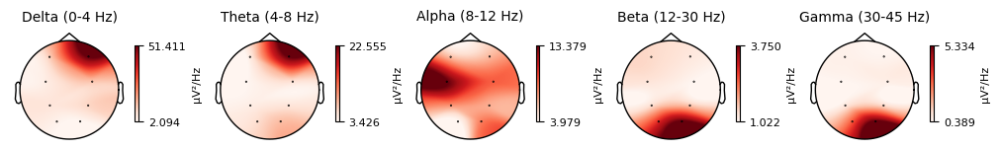

5
1
Effective window size : 8.008 (s)


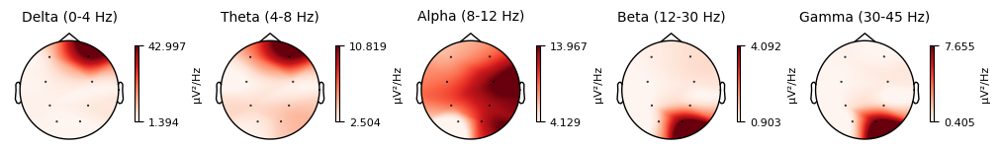

6
0
Effective window size : 8.008 (s)


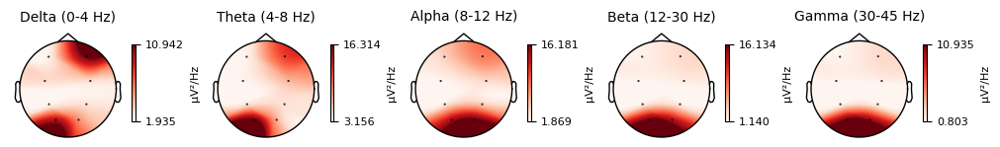

7
1
Effective window size : 8.008 (s)


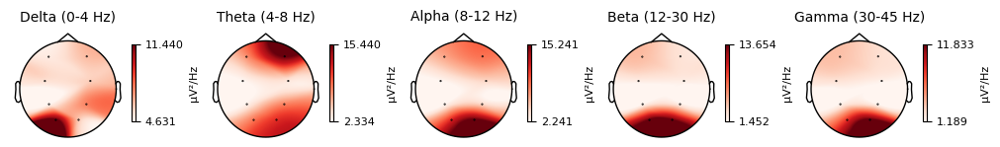

8
1
Effective window size : 8.008 (s)


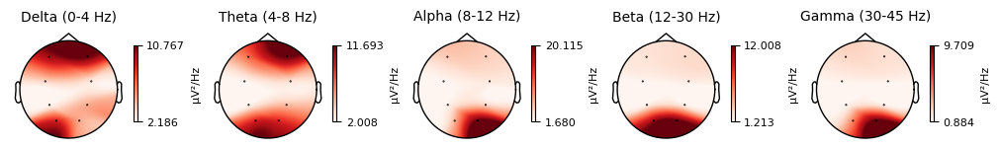

In [119]:
for j in range(9):
    print(j)

    print(marks[j])
    data[j].copy().compute_psd(picks="data").plot_topomap(ch_type='eeg', normalize=False, contours=0)

1


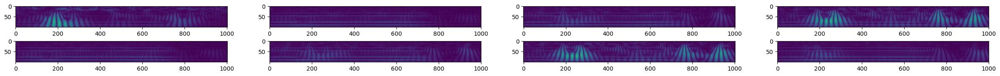

1


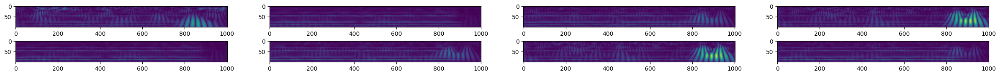

0


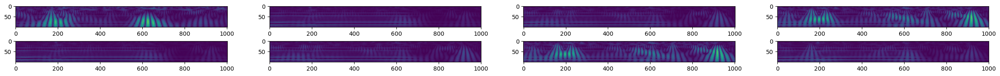

0


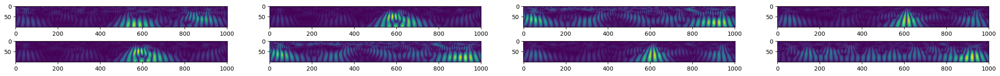

0


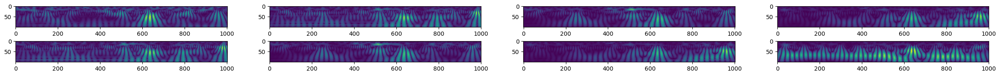

1


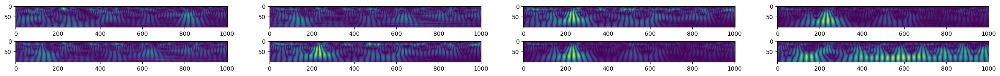

0


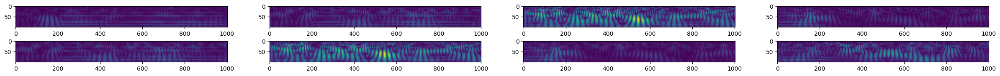

1


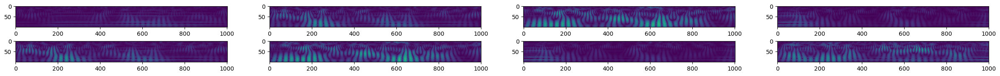

1


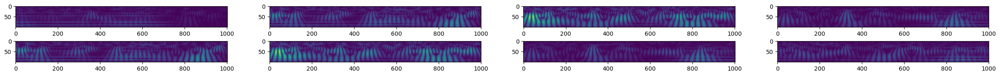

In [133]:
# генерация скалограммы 1 субъекта 1
wavelet = 'morl'
sampling_period = 1 / 125
scales = np.logspace(np.log10(2), np.log10(50), 100)
f = pywt.scale2frequency(wavelet, scales)/sampling_period
results_tr = []
#sample1 = tf.convert_to_tensor(values, dtype=tf.float32)
#gc.collect()
#print(values.shape)
# визуализация скалограммы 1 субъекта 1
for j in range(9):
    #cwtmatr, freqs = pywt.cwt(data[j].get_data().copy(), np.logspace(np.log10(1), np.log10(45), 50), wavelet=wavelet, axis=1)
    cwtmatr, freqs = pywt.cwt(data[j].get_data().copy(), np.linspace(2, 50, 100), wavelet=wavelet, axis=1)
    values = np.abs(cwtmatr)
    values = np.swapaxes(values, 0, 1)
    fig, axarr = plt.subplots(2, 4, figsize=(30,2)) 
    for i in range(2):
      for a in range(4):
        axarr[i][a].imshow(values[i+a])
    print(marks[j])
    plt.show()

In [56]:
data[j].get_data().shape

(8, 376)

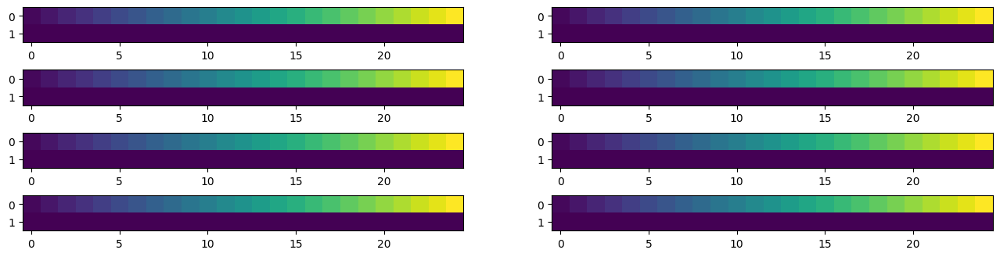

In [83]:
import emd
fig, axarr = plt.subplots(4, 2, figsize=(16,4))
for i in range(4):
    for j in range(2):
        imf = emd.sift.sift(data[i+j-1,:])
        IP, IF, IA = emd.spectra.frequency_transform(imf, 125, 'hilbert')
        freq_edges, freq_bins = emd.spectra.define_hist_bins(0, 25, 25)
        hht = emd.spectra.hilberthuang(IF, IA, freq_edges)
        #print(hht)
        #hht[hht > 0.0] = 1.0
        #ht = np.nan_to_num(hht, nan=0.0, posinf=0.0, neginf=0.0)
        axarr[i][j].imshow(hht)
plt.show()

(8, 100, 376)


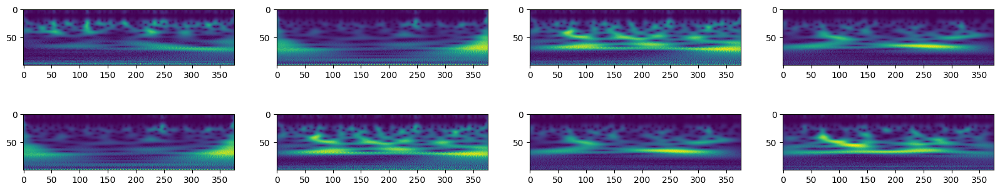

In [81]:
# визуализация скалограммы одной записи
wavelet = 'cmor1.5-1.0'
sampling_period = 1 / 125
scales = np.logspace(np.log10(2), np.log10(320), 75)
f = pywt.scale2frequency(wavelet, scales)/sampling_period
#print(list(zip(f, scales)))
data = loaded_data.get_data()
cwtmatr, freqs = pywt.cwt(data, np.logspace(np.log10(1), np.log10(320), 100), wavelet=wavelet, axis=1)
values = np.abs(cwtmatr)
values = np.swapaxes(values, 0, 1)
print(values.shape)
fig, axarr = plt.subplots(2, 4, figsize=(20,4)) 
for i in range(2):
  for j in range(4):
    axarr[i][j].imshow(values[i+j])
plt.show()

In [3]:
events = mne.events_from_annotations(loaded_data)
arr_events = events[0]
arr_events

Used Annotations descriptions: ['end task', 'fake wrong answer', 'right answer', 'start task']


array([[     1,      0,      4],
       [ 30760,      0,      2],
       [ 30925,      0,      1],
       [ 30925,      0,      4],
       [ 62368,      0,      2],
       [ 62524,      0,      1],
       [ 62524,      0,      4],
       [ 97123,      0,      3],
       [ 97333,      0,      1],
       [ 97333,      0,      4],
       [113761,      0,      3],
       [113926,      0,      1],
       [113926,      0,      4],
       [148156,      0,      3],
       [148327,      0,      1],
       [148327,      0,      4],
       [179641,      0,      3],
       [180052,      0,      1],
       [180052,      0,      4],
       [190804,      0,      3],
       [190804,      0,      1],
       [190804,      0,      4]])

In [4]:
arr_events.shape

(22, 3)

In [5]:
filtered_data = loaded_data.copy().filter(l_freq=None, h_freq=40., fir_design='firwin', method='iir', iir_params=None)
filtered_data = filtered_data.copy().filter(l_freq=2.,h_freq=None, fir_design='firwin', method='iir', iir_params=None)

raw_data = filtered_data.get_data()

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 40 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 40.00 Hz: -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 2 Hz

IIR filter parameters
---------------------
Butterworth highpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 2.00 Hz: -6.02 dB



In [6]:
filtered_data.info

<Info | 7 non-empty values
 bads: []
 ch_names: O1, P3, C3, F3, F4, C4, P4, O2
 chs: 8 EEG
 custom_ref_applied: False
 highpass: 2.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2023-05-24 17:03:51 UTC
 nchan: 8
 projs: []
 sfreq: 125.0 Hz
>

Using matplotlib as 2D backend.


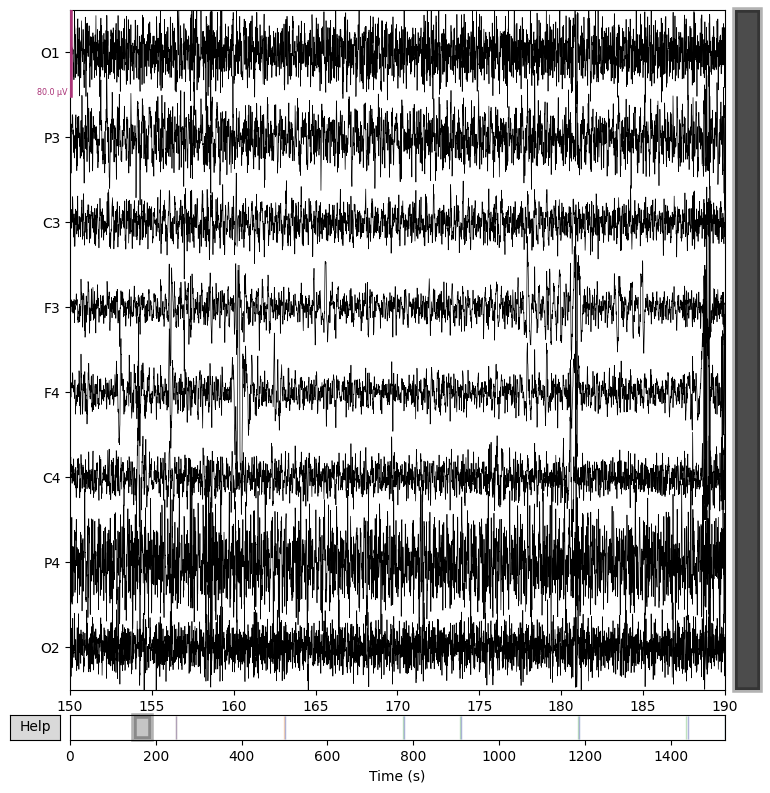

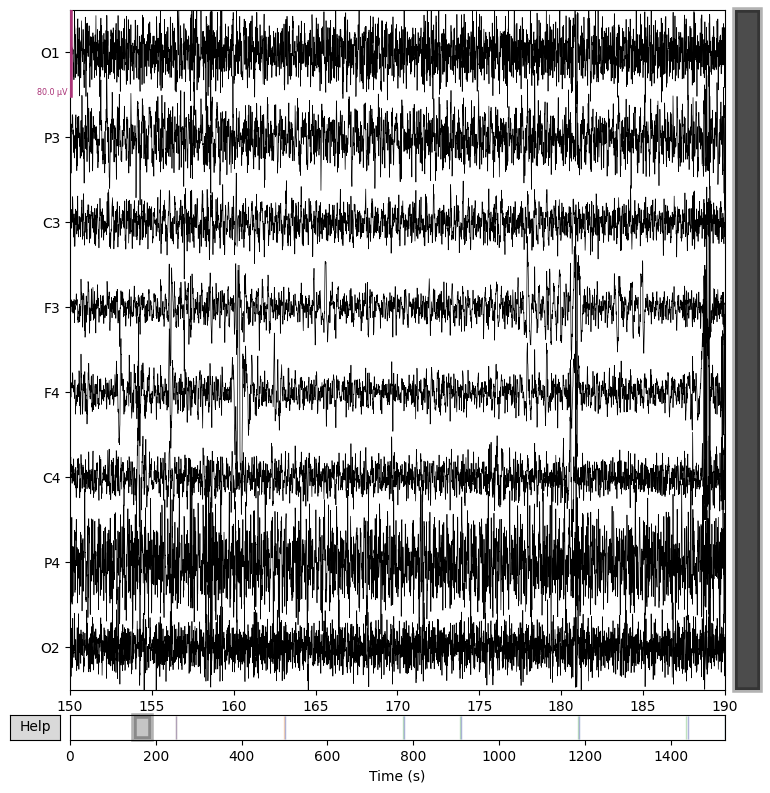

In [7]:
filtered_data.plot(start=150, duration=40, proj=False, n_channels=len(filtered_data.ch_names), remove_dc=False, scalings=40e-6)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.384 (s)


C:\Users\Ilya\AppData\Local\Temp\ipykernel_11320\3296019125.py:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  filtered_data.plot_psd(area_mode='range', tmax=1200.0, picks='data', average=False)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


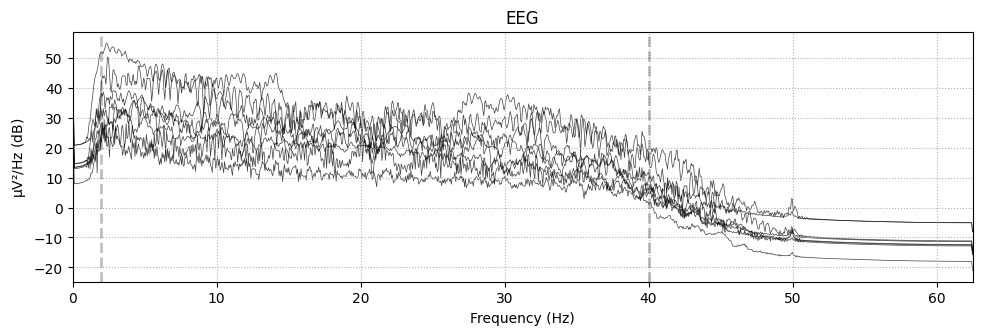

In [8]:
picks = mne.pick_types(filtered_data.info, meg='mag', eeg=True, eog=False, stim=False, exclude='bads')
filtered_data.plot_psd(area_mode='range', tmax=1200.0, picks='data', average=False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.384 (s)


C:\Users\Ilya\AppData\Local\Temp\ipykernel_11320\1547064175.py:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  loaded_data.plot_psd(area_mode='range', tmax=40.0, picks='data', average=False)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


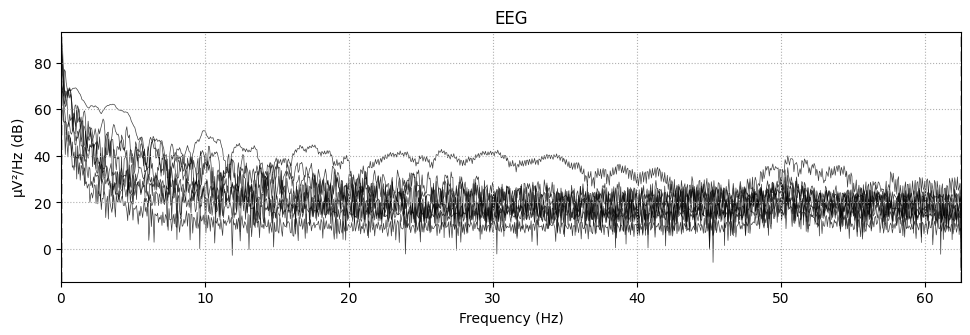

In [9]:
loaded_data.plot_psd(area_mode='range', tmax=40.0, picks='data', average=False)

In [10]:
ans_data = np.zeros((1,8,165))
marks = []
for i in range(arr_events.shape[0]-4):
    if (arr_events[i,2] == 2) or (arr_events[i,2] == 3):
        ans = raw_data[:,arr_events[i,0]:(arr_events[i,0]+165)]
        ans = ans.reshape(1,ans.shape[0],ans.shape[1])
        ans_data = np.concatenate((ans_data, ans), axis=0)
        marks.append(arr_events[i,2]-2)
        
ans_data = ans_data[1:,:,:]
print(ans_data.shape)

(6, 8, 165)


In [11]:
X = ans_data.copy()
X.shape

(6, 8, 165)

In [12]:
Y = np.array(marks)
Y.shape

(6,)

In [14]:
from sklearn.model_selection import train_test_split
X = X.reshape(X.shape[0], X.shape[1]*X.shape[2])
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=0)
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(4, 1320) (2, 1320) (4,) (2,)


In [15]:
from sklearn.preprocessing import Normalizer
scaler = Normalizer().fit(x_train)
stand_x_train = scaler.transform(x_train)
scaler = Normalizer().fit(x_test)
stand_x_test = scaler.transform(x_test)
stand_x_test

array([[ 0.01381141,  0.0080356 ,  0.0024506 , ...,  0.00513701,
        -0.00328882, -0.00718541],
       [-0.00128062, -0.00791346, -0.04249903, ..., -0.05195689,
         0.01387797,  0.02738478]])

In [16]:
from sklearn import neighbors
knn = neighbors.KNeighborsClassifier(n_neighbors = 3)
knn.fit(stand_x_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
data_dir = Path("data")
for file in data_dir.iterdir():
    if file.suffix == ".edf":
        